# SVD Approximation

In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageOps
from google.colab import drive
import re
from datetime import datetime
import os

# Load the TensorBoard notebook extension
%load_ext tensorboard
%tensorflow_version 2.x
from tensorboard.plugins.hparams import api as hp
# Clear any logs from previous tensorboard runs
!rm -rf /tmp/mylogs
writer = tf.summary.create_file_writer('/tmp/mylogs')

drive.mount('/gdrive', force_remount=True)

Mounted at /gdrive


## Algorithm 1 - Stardard SVD Decomposition

In [2]:
def svd1(x_in, Verbose=False, correction_factor=1e-12):
    """
    @brief      Short-hand for applying SVD and dealing with non-converging SVD.
    
    @param      x     input matrix
    
    @return     the U, s, V first components
    """
    x = x_in.copy()
    m, n = x.shape
    not_converged = True
    max_tries = 1000
    i = 0
    while not_converged:
        try:
            u, s, v = np.linalg.svd(x, full_matrices=False)
        except np.linalg.linalg.LinAlgError as e:
            # ==================================================================
            # If SVD didn't converge, add a small error to the matrix and
            # repeat, otherwise the heuristic will always generate zero
            # components.
            # ==================================================================
            if Verbose:
                print("[WARNING] Exception caught: {}". format(e))
                if np.isnan(x).any():
                    print("[WARNING] The provided matrix contains NaNs.")
                if np.isinf(x).any():
                    print("[WARNING] The provided matrix contains Infs.")
            u = np.zeros((m, m))
            s = np.zeros((n,))
            v = np.zeros((n, n))
            x -= correction_factor
        if np.any(s): # not all zeros
            not_converged = False
        # If still not converging and max tries reached, return svd components
        # that are close to zero.
        if not_converged and i == max_tries:
            not_converge = False
            u = np.zeros((m, m))
            s = np.zeros((n,))
            v = np.zeros((n, n))
            u += 1e-15
            s += 1e-15
            v += 1e-15
        i += 1
    return u.T[0], s[0], v[0]

In [3]:
x = np.random.randn(32, 16)
svd1(x)

(array([-0.23517926, -0.22266451, -0.04113012,  0.12105154,  0.09157681,
         0.31938436,  0.06855524, -0.09182536,  0.1314608 , -0.09691401,
        -0.18813444, -0.03940004,  0.11687518,  0.12699954,  0.06467241,
        -0.33720879, -0.08737761, -0.01283995,  0.01086322,  0.32436626,
        -0.15699125, -0.23119637,  0.02632368,  0.02199429, -0.10579826,
         0.3113676 ,  0.26651324,  0.22477058,  0.17408367, -0.03829521,
         0.14641498,  0.2619741 ]),
 8.688512368755092,
 array([-0.17232688, -0.50307578,  0.04739223, -0.25651778,  0.02782118,
        -0.33456374, -0.36638351, -0.35588306, -0.24278886,  0.0009277 ,
         0.17219074,  0.20284928,  0.12503761,  0.21298591,  0.14851794,
        -0.25054842]))

## Algorithm 2 - Joshua Paper

Decompose `k` matrices into `r` sub-matrices.

In [4]:
def mse(a, b):
    return ((a - b)**2).mean()

def avg_abs_diff(a, b):
    return np.absolute(a - b).mean()

def frobenius_norm(a, b):
    return np.sqrt(np.absolute(np.linalg.norm(a - b)))

def frobenius(x):
    return (x**2).sum()

def check_threshold(U, U_step, V, V_step, stop_threshold=0.00005,
                       config='mse'):
    """
    @brief      Determines the threshold for stopping vectors refinements
    
    @param      U        []
    @param      U_step   []
    @param      V        []
    @param      V_step   []
    
    @return     whether to stop refinement process
    """
    if config == 'mse':
        diff_u = mse(U, U_step)
        diff_v = mse(V, V_step)
    elif config == 'avg':
        diff_u = avg_abs_diff(U, U_step)
        diff_v = avg_abs_diff(V, V_step)
    elif config == 'frobenius-norm':
        diff_u = frobenius_norm(U, U_step)
        diff_v = frobenius_norm(V, V_step)
    elif config == 'norm':
        diff_u = np.linalg.norm(U - U_step)
        diff_v = np.linalg.norm(V - V_step)
    if diff_v < stop_threshold and diff_u < stop_threshold:
        return True, diff_u, diff_v
    else:
        return False, diff_u, diff_v

In [5]:
def get_vec_from_largest_eig(x):
    w, vr = np.linalg.eigh(x)
    return vr[:, np.argmax(w)]

In [6]:
def update_F(F, U, V):
    FT = np.transpose(F, axes=(0, 2, 1))
    S = V.T @ FT @ U
    A = np.outer(U, V)
    F_tmp = np.zeros(F.shape)
    for i in range(F.shape[0]):
        F_tmp[i] = F[i] - S[i] * A
    return F_tmp, S

def algorithm2(F_in, r=1, stop_threshold=0.0001, hard_stop=100,
               decomposition='eigen', truncate=False, metric='mse',
               report_writer=None, report_step=0, scaler=None, Verbose=False):
    """
    @brief      Algorithm from "Synthesis and Optimization
                of 2D Filter Designs for Heterogeneous FPGAs"
    
    @param      F_in     List or array of matrixes to approximate 
                         (they must have same shape)
    @param      r        The number of sub-matrices
    @param      Verbose  Verbose
    
    @return     the eigenvalues lambda_ij and vectors u and v
    """
    if isinstance(F_in, (list,)):
        k = len(F_in)
        m, n = F_in[0].shape
        F = np.zeros((k, m, n))
        for i in range(k):
            F[i] = F_in[i].copy()
    else:
        k, m, n = F_in.shape
        F = np.array(F_in, copy=True)
    # hard_stop = 100
    # stop_threshold = 0.0001 # F.std()
    if truncate:
        tot_elem = k * (m * n)
        appr_elem = k * (m + n + r)
        if appr_elem >= tot_elem:
            print('[WARNING] The r value ({}) is too high and will be truncated.'.format(r))
            while appr_elem >= tot_elem:
                r -= 1
                appr_elem = k * (m + n + r)
            print('[WARNING] r set to {}.'. format(r))
    if scaler is None:
        scaler = np.ones((k))
    u_array = np.zeros((r, m))
    s_array = np.zeros((r, k))
    v_array = np.zeros((r, n))
    # NOTE: Given a matrix A, we have that: A @ A.T is symmetrical! Meaning
    # that, for the spectral theorem, A has real eigenvalues!
    for j in range(r):
        # Form the (m x m) matrix Fn: sum[0,k-1](F[i] @ F[i].T)
        Fn = np.zeros((m, m))
        for i in range(k):
            Fn += scaler[i] * F[i] @ F[i].T # SQUARED
        # Calculate the eigenvector u that corresponds to the largest eigenvalue 
        if decomposition == 'eigen':
            u = get_vec_from_largest_eig(Fn)
        else:
            u, _, _ = svd1(Fn)
        # Form the (n x k) matrix: Fb = [F[0].T @ u, F[1].T @ u, ..., F[k-1].T @ u]
        Fb = np.zeros((n, k))
        for i in range(k):
            Fb[:,i] = scaler[i] * F[i].T @ u
        # Calculate the eigenvector v that corresponds to the largest 
        # eigenvalue of the (n x n) matrix: Fb @ Fb.T
        Fb = Fb @ Fb.T
        if decomposition == 'eigen':
            v = get_vec_from_largest_eig(Fb)
        else:
            _, _, v = svd1(Fb)
        U = u
        V = v
        for t in range(hard_stop):
            # Form the (k x m) matrix Fb = [F[0] @ v, F[1] @ v, ..., F[k-1] @ v].T
            FbT = np.zeros((m, k))
            for i in range(k):
                FbT[:, i] = scaler[i] * F[i] @ v
            Fb = FbT.T
            # Calculate the eigenvector u that corresponds to the largest 
            # eigenvalue of the (m x m) matrix
            Fb = FbT @ Fb
            if decomposition == 'eigen':
                u = get_vec_from_largest_eig(Fb)
            else:
                u, _, _ = svd1(Fb)
            # Form the (n x k) matrix Fb = [F[0].T @ u, F[1].T @ u, ..., F[k-1].T @ u].T
            FbT = np.zeros((k, n))
            for i in range(k):
                FbT[i] = scaler[i] * F[i].T @ u
            Fb = FbT.T
            # Calculate the eigenvector v that corresponds to the largest 
            # eigenvalue of the (n x n) matrix
            Fb = Fb @ FbT
            if decomposition == 'eigen':
                v = get_vec_from_largest_eig(Fb)
            else:
                _, _, v = svd1(Fb)
            # Until u and v vectors change less than a pre-specified
            # value that is set by the user
            stop_refinement, diff_u, diff_v = check_threshold(u, U, v, V, stop_threshold, metric)
            if report_writer is not None:
                with report_writer.as_default():
                    F_tmp, _ = update_F(F, U, V)
                    for p, (f_in, f_tmp) in enumerate(zip(F_in, F_tmp)):
                        tf.summary.scalar(f'Alg2 - MSE {p}-th sub-matrix', mse(f_in, f_tmp), report_step, description=f'Algorithm2 MSE(x, x_approx) of the {p}-th sub-matrix.')
                        tf.summary.scalar(f'Alg2 - Mean {p}-th sub-matrix',f_tmp.mean(), report_step, description=f'Algorithm2 Mean(x_approx) of the {p}-th sub-matrix.')
                        report_writer.flush()
                    # tf.summary.scalar('Alg2 - MSE refining', mse(F_in, F_tmp), report_step, description='Algorithm2 MSE(F, F_approx) at refining steps.')
                    # tf.summary.scalar('Alg2 - diff(U)', diff_u, report_step, description='Algorithm2 MSE(u(i), u(i-1)) at refining steps.')
                    # tf.summary.scalar('Alg2 - diff(V)', diff_v, report_step, description='Algorithm2 MSE(v(i), v(i-1)) at refining steps.')
                    # NOTE: The u and v norms are always equal to 1.
                    # tf.summary.scalar('Alg2 - norm(U)', np.linalg.norm(u), report_step, description='Algorithm2 norm(u(i)) at refining steps.')
                    # tf.summary.scalar('Alg2 - norm(V)', np.linalg.norm(v), report_step, description='Algorithm2 norm(v(i)) at refining steps.')
                    # tf.summary.scalar('Alg2 - <U, u>', np.dot(U, u), report_step, description='Algorithm2 <U, u>: inner-product (orthogonal if 0).')
                    # tf.summary.scalar('Alg2 - <V, v>', np.dot(V, v), report_step, description='Algorithm2 <V, v>: inner-product (orthogonal if 0).')
                    report_writer.flush()
                    report_step += 1
            if stop_refinement:
                V, U = v, u
                break
            V = v #* (1 + 1e-12)
            U = u #* (1 + 1e-12)
        if report_writer is not None and r > 1:
            with report_writer.as_default():
                F_tmp, _ = update_F(F, U, V)
                for p, (f_in, f_tmp) in enumerate(zip(F_in, F_tmp)):
                    tf.summary.scalar(f'Alg2 - Final MSE {p}-th sub-matrix', mse(f_in, f_tmp), report_step, description=f'Algorithm2 MSE(x, x_approx) of the {p}-th sub-matrix.')
                    report_writer.flush()
                report_step += 1
        # F, S = update_F(F, U, V)
        FT = np.transpose(F, axes=(0, 2, 1))
        S = V.T @ FT @ U
        A = np.outer(U, V)
        for i in range(k):
            F[i] = F[i] - S[i] * A
        u_array[j] = U
        s_array[j] = S
        v_array[j] = V
    return u_array, s_array, v_array

In [7]:
x = np.random.rand(3, 1024, 512)

In [8]:
%time u_eig, s_eig, v_eig = algorithm2(x, decomposition='eigen', stop_threshold=1e-5)

CPU times: user 1.42 s, sys: 478 ms, total: 1.89 s
Wall time: 1.04 s


In [9]:
%time u_svd, s_svd, v_svd = algorithm2(x, decomposition='svd', stop_threshold=1e-5)

CPU times: user 3.29 s, sys: 591 ms, total: 3.88 s
Wall time: 2 s


In [10]:
print(mse(u_eig, u_svd))
print(mse(s_eig, s_svd))
print(mse(v_eig, v_svd))

0.003906249999999999
4.52364397489937e-26
0.007812499999999998


Get approximation error.

In [11]:
def algorithm2_inverse(U, S, V, F=None):
    F_tmp = np.einsum('rk, rm, rn->kmn', S, U, V)
    if F is None:
        F = F_tmp
    elif type(F) == list:
        k = S.shape[1]
        for i in range(k):
            F.append(F_tmp[i])
    return F_tmp

In [12]:
x_svd = algorithm2_inverse(u_svd, s_svd, v_svd)
x_eig = algorithm2_inverse(u_eig, s_eig, v_eig)
print(mse(x, x_svd))
print(mse(x, x_eig))

0.08324823102157376
0.08324823102157376


## Algortihm 3 - SVD and Refinement Steps

In [57]:
def algorithm3(x_in, num_refinements=1, num_sub_matrix=1, truncate=False,
               stop_threshold=0.0001, hard_stop=100, decomposition='eigen',
               metric='mse', scaler=None, report_writer=None,
               apply_scaling_at_alg2=True, plotdata=None):
    if type(x_in) == list:
        x = np.concatenate([a[np.newaxis,:] for a in x_in], axis=0)
    else:
        x = x_in
    k, m, n = x.shape
    if truncate:
        tot_elem = 2 * (m * n)
        appr_elem = num_refinements * (m + n + x.shape[0])
        if appr_elem >= tot_elem:
            print(f'[WARNING] The num_refinements value ({num_refinements}) is too high and will be truncated.')
            while appr_elem >= tot_elem:
                num_refinements -= 1
                appr_elem = num_refinements * (m + n + x.shape[0])
            print(f'[WARNING] num_refinements set to {num_refinements}.')
    u = np.zeros((num_refinements, num_sub_matrix, m))
    s = np.zeros((num_refinements, num_sub_matrix, k))
    v = np.zeros((num_refinements, num_sub_matrix, n))
    report_steps = 0
    if apply_scaling_at_alg2:
        # ======================================================================
        # Apply scaling at Alogirthm 2 (Default)
        # ======================================================================
        x_approx = np.zeros(x.shape)
        for i in range(num_refinements):
            u[i], s[i], v[i] = algorithm2(x - x_approx, num_sub_matrix,
                                        stop_threshold, hard_stop, decomposition,
                                        truncate, metric, report_writer,
                                        report_steps, scaler)
            x_approx += algorithm2_inverse(u[i], s[i], v[i])
            if report_writer is not None:
                with report_writer.as_default():
                    tf.summary.scalar('Alg3 - MSE', mse(x, x_approx), i, description='Algorithm3 MSE(x, x_approx).')
                    for p, (f_in, f_tmp) in enumerate(zip(x, x_approx)):
                        tf.summary.scalar(f'Alg3 - MSE {p}-th sub-matrix', mse(f_in, f_tmp), i, description=f'Algorithm3 MSE(x, x_approx) of the {p}-th sub-matrix.')
                        tf.summary.scalar(f'Alg3 - Mean {p}-th sub-matrix', f_tmp.mean(), i, description=f'Algorithm3 Mean(x_approx) of the {p}-th sub-matrix.')
                        tf.summary.scalar(f'Alg3 - Mean Original {p}-th sub-matrix', f_in.mean(), i, description=f'Algorithm3 Mean(x) of the {p}-th sub-matrix.')
                    report_writer.flush()
            if plotdata is not None:
                if not plotdata: # If empty, initialize it
                    for p in range(k):
                        plotdata[f'MSE(matrix[{p}])'] = []
                for p, (f_in, f_tmp) in enumerate(zip(x, x_approx)):
                    plotdata[f'MSE(matrix[{p}])'].append(mse(f_in, f_tmp))
    else:
        # ======================================================================
        # Apply scaling at Alogirthm 3 (To be checked)
        # ======================================================================
        x_approx = np.zeros(x.shape)
        x_scaled = x.copy()
        error = x - x_approx
        if scaler is None:
            scaler = [1.] * k
        for j in range(k):
            x_scaled[j] *= scaler[j]
            error[j] = x_scaled[j]
        for i in range(num_refinements):
            u[i], s[i], v[i] = algorithm2(error, num_sub_matrix,
                                        stop_threshold, hard_stop, decomposition,
                                        truncate, metric, report_writer,
                                        report_steps, scaler=None)
            for j in range(k):
                s[j] /= scaler[j]
            x_approx += algorithm2_inverse(u[i], s[i], v[i])
            # for j in range(k):
            #     x_approx[j] *= scaler[j]
            error = x_scaled - x_approx
            # for j in range(k):
            #     error[j] *= scaler[j]
            if report_writer is not None:
                with report_writer.as_default():
                    tf.summary.scalar('Alg3 - MSE', mse(x, x_approx), i, description='Algorithm3 MSE(x, x_approx).')
                    for p, (f_in, f_tmp) in enumerate(zip(x, x_approx)):
                        tf.summary.scalar(f'Alg3 - MSE {p}-th sub-matrix', mse(f_in, f_tmp), i, description=f'Algorithm3 MSE(x, x_approx) of the {p}-th sub-matrix.')
                        tf.summary.scalar(f'Alg3 - Mean {p}-th sub-matrix', f_tmp.mean(), i, description=f'Algorithm3 Mean(x_approx) of the {p}-th sub-matrix.')
                        tf.summary.scalar(f'Alg3 - Mean Original {p}-th sub-matrix', f_in.mean(), i, description=f'Algorithm3 Mean(x) of the {p}-th sub-matrix.')
                    report_writer.flush()
            if plotdata is not None:
                if not plotdata: # If empty, initialize it
                    for p in range(k):
                        plotdata[f'MSE(matrix[{p}])'] = []
                for p, (f_in, f_tmp) in enumerate(zip(x, x_approx)):
                    plotdata[f'MSE(matrix[{p}])'].append(mse(f_in, f_tmp))
    return u, s, v

In [14]:
def algorithm3_inverse(U, S, V):
    """
    @brief      Given a list of u, s, v vectors, reconstruct 
    the two approximated matrixes.
    
    @param      U     list of u vectr
    @param      S     list of s vectr
    @param      V     list of v vectr
    
    @return     the reconstructed approximated matrix (concatened)
    """
    # NOTE: The shape variables are:
    #   r := number of refinement steps
    #   k := number of merged matrixes
    #   m := "input" dimension of the matrixes
    #   n := "output" dimension of the matrixes
    u, s, v = np.array(U), np.array(S), np.array(V)
    F = np.einsum('...rk, ...rm, ...rn', s, u, v)
    F = np.einsum('rkmn->kmn', F)
    return F

In [15]:
x = np.random.rand(3, 1024, 512)
%time u_eig, s_eig, v_eig = algorithm3(x, 4, decomposition='eigen', stop_threshold=1e-3)

CPU times: user 7.58 s, sys: 1.92 s, total: 9.5 s
Wall time: 4.94 s


In [16]:
%time u_svd, s_svd, v_svd = algorithm3(x, 4, decomposition='svd', stop_threshold=1e-3)

CPU times: user 16.4 s, sys: 3.08 s, total: 19.4 s
Wall time: 9.97 s


In [17]:
x_svd = algorithm3_inverse(u_svd, s_svd, v_svd)
x_eig = algorithm3_inverse(u_eig, s_eig, v_eig)
print(mse(x, x_svd))
print(mse(x, x_eig))

0.08266490425610987
0.0826586846848718


### Algorithm 3 - Extra Refinements

In [18]:
def algorithm3_extra_refinements(x_in, u_in, s_in, v_in, num_refinements=1, num_sub_matrix=1, truncate=False,
               stop_threshold=0.0001, hard_stop=100, decomposition='eigen',
               metric='mse', scaler=None,
               report_writer=None):
    previous_num_refinements = u_in.shape[0]
    assert previous_num_refinements <= num_refinements, f'Previous #Refinements ({previous_num_refinements}) must be less then num_refinements ({num_refinements}).'
    if type(x_in) == list:
        x = np.concatenate([a[np.newaxis,:] for a in x_in], axis=0)
    else:
        x = x_in
    k, m, n = x.shape
    if truncate:
        tot_elem = 2 * (m * n)
        appr_elem = num_refinements * (m + n + x.shape[0])
        if appr_elem >= tot_elem:
            print(f'[WARNING] The num_refinements value ({num_refinements}) is too high and will be truncated.')
            while appr_elem >= tot_elem:
                num_refinements -= 1
                appr_elem = num_refinements * (m + n + x.shape[0])
            print(f'[WARNING] num_refinements set to {num_refinements}.')
    u = np.zeros((num_refinements, num_sub_matrix, m))
    s = np.zeros((num_refinements, num_sub_matrix, k))
    v = np.zeros((num_refinements, num_sub_matrix, n))

    u[:previous_num_refinements] = u_in
    s[:previous_num_refinements] = s_in
    v[:previous_num_refinements] = v_in

    report_steps = 0
    # ==========================================================================
    # Scaler version
    # ==========================================================================
    x_approx = algorithm3_inverse(u_in, s_in, v_in)
    x_scaled = x.copy()
    error = x - x_approx
    if scaler is None:
        scaler = [1.] * k
    for j in range(k):
        x_scaled[j] *= scaler[j]
        error[j] = x_scaled[j]
    for i in range(previous_num_refinements, num_refinements):
        u[i], s[i], v[i] = algorithm2(error, num_sub_matrix,
                                      stop_threshold, hard_stop, decomposition,
                                      truncate, metric, report_writer,
                                      report_steps, scaler=None)
        for j in range(k):
            s[j] /= scaler[j]
        x_approx += algorithm2_inverse(u[i], s[i], v[i])
        for j in range(k):
            x_approx[j] *= scaler[j]
        error = x_scaled - x_approx
        # for j in range(k):
        #     error[j] *= scaler[j]
        if report_writer is not None:
            with report_writer.as_default():
                tf.summary.scalar('Alg3 - MSE', mse(x, x_approx), i, description='Algorithm3 MSE(x, x_approx).')
                for p, (f_in, f_tmp) in enumerate(zip(x, x_approx)):
                    tf.summary.scalar(f'Alg3 - MSE {p}-th sub-matrix', mse(f_in, f_tmp), i, description=f'Algorithm3 MSE(x, x_approx) of the {p}-th sub-matrix.')
                    tf.summary.scalar(f'Alg3 - Mean {p}-th sub-matrix', f_tmp.mean(), i, description=f'Algorithm3 Mean(x_approx) of the {p}-th sub-matrix.')
                    tf.summary.scalar(f'Alg3 - Mean Original {p}-th sub-matrix', f_in.mean(), i, description=f'Algorithm3 Mean(x) of the {p}-th sub-matrix.')
                report_writer.flush()
    # ==========================================================================
    # Original version
    # ==========================================================================
    # x_approx = np.zeros(x.shape)
    # for i in range(num_refinements):
    #     u[i], s[i], v[i] = algorithm2(x - x_approx, num_sub_matrix,
    #                                   stop_threshold, hard_stop, decomposition,
    #                                   truncate, metric, report_writer,
    #                                   report_steps, scaler)
    #     x_approx += algorithm2_inverse(u[i], s[i], v[i])
    #     if report_writer is not None:
    #         with report_writer.as_default():
    #             tf.summary.scalar('Alg3 - MSE', mse(x, x_approx), i, description='Algorithm3 MSE(x, x_approx).')
    #             for p, (f_in, f_tmp) in enumerate(zip(x, x_approx)):
    #                 tf.summary.scalar(f'Alg3 - MSE {p}-th sub-matrix', mse(f_in, f_tmp), i, description=f'Algorithm3 MSE(x, x_approx) of the {p}-th sub-matrix.')
    #                 tf.summary.scalar(f'Alg3 - Mean {p}-th sub-matrix', f_tmp.mean(), i, description=f'Algorithm3 Mean(x_approx) of the {p}-th sub-matrix.')
    #                 tf.summary.scalar(f'Alg3 - Mean Original {p}-th sub-matrix', f_in.mean(), i, description=f'Algorithm3 Mean(x) of the {p}-th sub-matrix.')
    #             report_writer.flush()
    return u, s, v

## Setup TensorBoard

In [19]:
tensorboard_dir = '/gdrive/My Drive/Colab Notebooks/svd/'
tensorboard_dir = re.escape(tensorboard_dir) # to include spaces
# %reload_ext tensorboard
# %rm -rf $tensorboard_dir/tensorboard/*
%tensorboard --logdir $tensorboard_dir/tensorboard

<IPython.core.display.Javascript object>

# Models

Currently, we have the following designs in place:

| Model Name | ID | #LSTMs | Input Size(s) | Hidden Size(s)| Test Accuracy | HW Requirements |
|---|---|---|---|---|---|---|
| Dense MNIST | mnist | 0 | 784 | 128 | 98% | |
| Fashion MNIST | fashion | 0 | 784 | 128 | 88% | |
| Fashion MNIST - LSTM | fashion-lstm | 2 | 128 | 256 | 86% | |
| CNN-RNN-UCF101 | cnn-lstm | 2 | 2048 | 256 | 65% |
| TrafficPredict | traffic-predict | N | ? | ? | ? | |


In [20]:
models = {}

In [21]:
checkpoint_dir = '/gdrive/My Drive/checkpoints/svd/'

def save_model(model_name):
    models[model_name].save(checkpoint_dir + model_name)
    models[model_name].save_weights(checkpoint_dir + model_name + '.h5')
    print(f'Model saved at: {checkpoint_dir + model_name}')

def load_model(model_name):
    if os.path.isdir(checkpoint_dir + model_name):
        models[model_name] = tf.keras.models.load_model(checkpoint_dir + model_name)
        if os.path.isfile(checkpoint_dir + model_name + '.h5'):
            print(f'Model "{model_name}" loaded with weights.')
            return True
        else:
            print(f'Model "{model_name}" loaded without weights.')
            return False
    else:
        print(f'Model "{model_name}" not found in: {checkpoint_dir}')
        return False

### MNIST - Dense

In [22]:
mnist = tf.keras.datasets.mnist

(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train, x_test = x_train / 255.0, x_test / 255.0

11493376/11490434 [==============================] - 0s 0us/step


In [23]:
models['mnist'] = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(28, 28)),
  tf.keras.layers.Dense(128, activation='relu', name='dense_1'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(10, name='dense_2')
], name='mnist')

models['mnist'].summary()

Model: "mnist"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 784)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)               100480    
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 10)                1290      
Total params: 101,770
Trainable params: 101,770
Non-trainable params: 0
_________________________________________________________________


In [24]:
models['mnist'].compile(optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'])

if not load_model('mnist'):
    models['mnist'].fit(x_train, y_train, epochs=5)
    save_model('mnist')

Model "mnist" loaded with weights.


In [25]:
models['mnist'].evaluate(x_test, y_test, verbose=2)

313/313 - 1s - loss: 0.0735 - accuracy: 0.9795


[0.07346832007169724, 0.9794999957084656]


## Fashion MNIST - Dense


In [26]:
fashion_mnist = tf.keras.datasets.fashion_mnist

(fashion_train_images, fashion_train_labels), (fashion_test_images, fashion_test_labels) = fashion_mnist.load_data()

4423680/4422102 [==============================] - 0s 0us/step


In [27]:
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

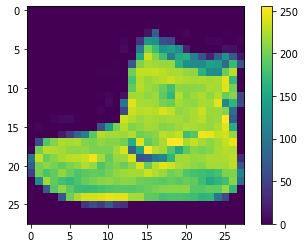

In [28]:
plt.figure()
plt.imshow(fashion_train_images[0])
plt.colorbar()
plt.grid(False)
plt.show()

Scale these values to a range of 0 to 1 before feeding them to the neural network model. To do so, divide the values by 255. It's important that the training set and the testing set be preprocessed in the same way:

In [29]:
fashion_train_images = fashion_train_images / 255.0
fashion_test_images = fashion_test_images / 255.0

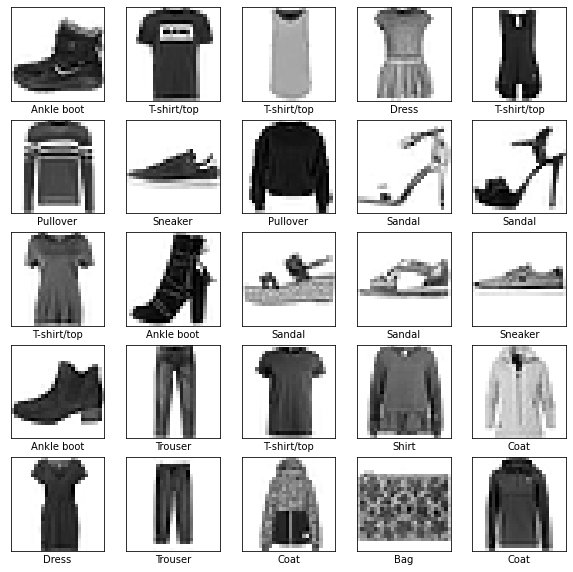

In [30]:
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(fashion_train_images[i], cmap=plt.cm.binary)
    plt.xlabel(class_names[fashion_train_labels[i]])
plt.show()

In [31]:
models['fashion'] = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(28, 28)),
    tf.keras.layers.Dense(128, activation='relu', name='dense_1'),
    tf.keras.layers.Dense(10, name='dense_2')
], name='fashion_mnist')
models['fashion'].summary()

Model: "fashion_mnist"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 784)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)               100480    
_________________________________________________________________
dense_2 (Dense)              (None, 10)                1290      
Total params: 101,770
Trainable params: 101,770
Non-trainable params: 0
_________________________________________________________________


In [32]:
models['fashion'].compile(optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'])

Train the model.

In [33]:
train_model = False
if not load_model('fashion') or train_model:
    models['fashion'].fit(fashion_train_images, fashion_train_labels, epochs=10)
    save_model('fashion')

Model "fashion" loaded with weights.


In [34]:
test_loss, test_acc = models['fashion'].evaluate(fashion_test_images, fashion_test_labels, verbose=2)
print('\nTest accuracy:', test_acc)

313/313 - 1s - loss: 0.3876 - accuracy: 0.8919

Test accuracy: 0.8919000029563904


## Fashion MNIST - LSTM

In [35]:
batch_size = 32
num_classes = 10
epochs = 2

row_hidden = 64
col_hidden = 64

row, col = fashion_train_images.shape[1:]

input = tf.keras.layers.Input(shape=(row, col))

def lstm_pipe(in_layer, lstm_name=''):
    x = tf.keras.layers.Conv1D(row_hidden, kernel_size=3, padding = 'same')(in_layer)
    x = tf.keras.layers.Conv1D(row_hidden, kernel_size=3, padding = 'same')(x)
    encoded_rows = tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(row_hidden, return_sequences = True))(x)
    return tf.keras.layers.LSTM(col_hidden, name='LSTM_' + lstm_name)(encoded_rows)
# Read it by rows
row_read = lstm_pipe(input, 'left')
# Read it by columns
transpose_read = lstm_pipe(tf.keras.layers.Permute(dims=(1,2))(input), 'right')
x = tf.concat([row_read, transpose_read], axis=1)
x = tf.keras.layers.Dropout(0.2)(x)
# prediction = tf.keras.layers.Dense(num_classes, activation='softmax')(x)
prediction = tf.keras.layers.Dense(num_classes)(x)
models['fashion-lstm'] = tf.keras.Model(input, prediction)
models['fashion-lstm'].compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
models['fashion-lstm'].summary()

models['fashion-lstm'].get_layer('LSTM_left').get_weights()[0].shape

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 28, 28)]     0                                            
__________________________________________________________________________________________________
permute (Permute)               (None, 28, 28)       0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1d (Conv1D)                 (None, 28, 64)       5440        input_1[0][0]                    
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, 28, 64)       5440        permute[0][0]                    
______________________________________________________________________________________________

(128, 256)

In [36]:
if not load_model('fashion-lstm'):
    models['fashion-lstm'].fit(fashion_train_images, fashion_train_labels, epochs=2, batch_size=batch_size)
    save_model('fashion-lstm')

Model "fashion-lstm" loaded with weights.


In [37]:
test_loss, test_acc = models['fashion-lstm'].evaluate(fashion_test_images, fashion_test_labels, verbose=2)
print('\nTest accuracy:', test_acc)

313/313 - 9s - loss: 0.3886 - accuracy: 0.8587

Test accuracy: 0.8586999773979187


## CNN-RNN-UCF101

In [38]:
!pip install -q git+https://github.com/tensorflow/docs

    Running setup.py install for tensorflow-docs ... done
  DEPRECATION: tensorflow-docs was installed using the legacy 'setup.py install' method, because a wheel could not be built for it. A possible replacement is to fix the wheel build issue reported above. You can find discussion regarding this at https://github.com/pypa/pip/issues/8368.


In [39]:
!wget -q https://git.io/JGc31 -O /tmp/ucf101_top5.tar.gz
!tar xf /tmp/ucf101_top5.tar.gz

In [40]:
from tensorflow_docs.vis import embed
from imutils import paths

import pandas as pd
import imageio
import cv2

In [41]:
IMG_SIZE = 224
BATCH_SIZE = 64
EPOCHS = 10

MAX_SEQ_LENGTH = 20
NUM_FEATURES = 2048

In [42]:
train_df = pd.read_csv("train.csv")
test_df = pd.read_csv("test.csv")

print(f"Total videos for training: {len(train_df)}")
print(f"Total videos for testing: {len(test_df)}")

train_df.sample(10)

Total videos for training: 594
Total videos for testing: 224


,video_name,tag
421,v_ShavingBeard_g17_c07.avi,ShavingBeard
391,v_ShavingBeard_g13_c02.avi,ShavingBeard
464,v_ShavingBeard_g24_c01.avi,ShavingBeard
339,v_Punch_g23_c02.avi,Punch
474,v_ShavingBeard_g25_c04.avi,ShavingBeard
138,v_PlayingCello_g11_c01.avi,PlayingCello
363,v_ShavingBeard_g08_c05.avi,ShavingBeard
256,v_Punch_g10_c05.avi,Punch
402,v_ShavingBeard_g15_c01.avi,ShavingBeard
510,v_TennisSwing_g12_c07.avi,TennisSwing


In [43]:
# The following two methods are taken from this tutorial:
# https://www.tensorflow.org/hub/tutorials/action_recognition_with_tf_hub


def crop_center_square(frame):
    y, x = frame.shape[0:2]
    min_dim = min(y, x)
    start_x = (x // 2) - (min_dim // 2)
    start_y = (y // 2) - (min_dim // 2)
    return frame[start_y : start_y + min_dim, start_x : start_x + min_dim]


def load_video(path, max_frames=0, resize=(IMG_SIZE, IMG_SIZE)):
    cap = cv2.VideoCapture(path)
    frames = []
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            frame = crop_center_square(frame)
            frame = cv2.resize(frame, resize)
            frame = frame[:, :, [2, 1, 0]]
            frames.append(frame)

            if len(frames) == max_frames:
                break
    finally:
        cap.release()
    return np.array(frames)

In [44]:
def build_feature_extractor():
    feature_extractor = tf.keras.applications.InceptionV3(
        weights="imagenet",
        include_top=False,
        pooling="avg",
        input_shape=(IMG_SIZE, IMG_SIZE, 3),
    )
    preprocess_input = tf.keras.applications.inception_v3.preprocess_input

    inputs = tf.keras.Input((IMG_SIZE, IMG_SIZE, 3))
    preprocessed = preprocess_input(inputs)

    outputs = feature_extractor(preprocessed)
    return tf.keras.Model(inputs, outputs, name="feature_extractor")

feature_extractor = build_feature_extractor()

87916544/87910968 [==============================] - 1s 0us/step


In [45]:
label_processor = tf.keras.layers.experimental.preprocessing.StringLookup(
    num_oov_indices=0, vocabulary=np.unique(train_df["tag"])
)
print(label_processor.get_vocabulary())

['', 'CricketShot', 'PlayingCello', 'Punch', 'ShavingBeard', 'TennisSwing']


In [46]:
def prepare_all_videos(df, root_dir):
    num_samples = len(df)
    video_paths = df["video_name"].values.tolist()
    labels = df["tag"].values
    labels = label_processor(labels[..., None]).numpy()

    # `frame_masks` and `frame_features` are what we will feed to our sequence model.
    # `frame_masks` will contain a bunch of booleans denoting if a timestep is
    # masked with padding or not.
    frame_masks = np.zeros(shape=(num_samples, MAX_SEQ_LENGTH), dtype="bool")
    frame_features = np.zeros(
        shape=(num_samples, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
    )

    # For each video.
    for idx, path in enumerate(video_paths):
        # Gather all its frames and add a batch dimension.
        frames = load_video(os.path.join(root_dir, path))
        frames = frames[None, ...]

        # Initialize placeholders to store the masks and features of the current video.
        temp_frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
        temp_frame_featutes = np.zeros(
            shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
        )

        # Extract features from the frames of the current video.
        for i, batch in enumerate(frames):
            video_length = batch.shape[1]
            length = min(MAX_SEQ_LENGTH, video_length)
            for j in range(length):
                temp_frame_featutes[i, j, :] = feature_extractor.predict(
                    batch[None, j, :]
                )
            temp_frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

        frame_features[idx,] = temp_frame_featutes.squeeze()
        frame_masks[idx,] = temp_frame_mask.squeeze()

    return (frame_features, frame_masks), labels

if os.path.isfile(checkpoint_dir + 'cnn-lstm/dataset.npz'):
    dataset = np.load(checkpoint_dir + 'cnn-lstm/dataset.npz')
    train_data = (dataset['train_data_0'], dataset['train_data_1'])
    test_data = (dataset['test_data_0'], dataset['test_data_1'])
    train_labels = dataset['train_labels']
    test_labels = dataset['test_labels']
else:
    train_data, train_labels = prepare_all_videos(train_df, "train")
    test_data, test_labels = prepare_all_videos(test_df, "test")

print(f"Frame features in train set: {train_data[0].shape}")
print(f"Frame masks in train set: {train_data[1].shape}")

Frame features in train set: (594, 20, 2048)
Frame masks in train set: (594, 20)


### The Sequence Model

In [47]:
# Utility for our sequence model.
def get_sequence_model():
    class_vocab = label_processor.get_vocabulary()

    frame_features_input = tf.keras.Input((MAX_SEQ_LENGTH, NUM_FEATURES))
    mask_input = tf.keras.Input((MAX_SEQ_LENGTH,), dtype="bool")

    # Refer to the following tutorial to understand the significance of using `mask`:
    # https://tf.keras.io/api/layers/recurrent_layers/gru/
    x = tf.keras.layers.LSTM(64, return_sequences=True, name='LSTM_1')(frame_features_input, mask=mask_input)
    x = tf.keras.layers.LSTM(32, name='LSTM_2')(x)
    # x = tf.keras.layers.GRU(16, return_sequences=True)(frame_features_input, mask=mask_input)
    # x = tf.keras.layers.GRU(8)(x)
    x = tf.keras.layers.Dropout(0.4)(x)
    x = tf.keras.layers.Dense(8, activation="relu")(x)
    output = tf.keras.layers.Dense(len(class_vocab), activation="softmax")(x)

    rnn_model = tf.keras.Model([frame_features_input, mask_input], output)

    rnn_model.compile(
        loss="sparse_categorical_crossentropy", optimizer="adam", metrics=["accuracy"]
    )
    return rnn_model

# Utility for running experiments.
def run_experiment():
    filepath = "/tmp/video_classifier"
    checkpoint = tf.keras.callbacks.ModelCheckpoint(
        filepath, save_weights_only=True, save_best_only=True, verbose=1
    )
    seq_model = get_sequence_model()
    history = seq_model.fit(
        [train_data[0], train_data[1]],
        train_labels,
        validation_split=0.3,
        epochs=EPOCHS,
        callbacks=[checkpoint],
    )
    seq_model.load_weights(filepath)
    _, accuracy = seq_model.evaluate([test_data[0], test_data[1]], test_labels)
    print(f"Test accuracy: {round(accuracy * 100, 2)}%")
    return history, seq_model

train_model = False
if not load_model('cnn-lstm') or train_model:
    _, models['cnn-lstm'] = run_experiment()
    save_model('cnn-lstm')

Model "cnn-lstm" loaded with weights.


### Inference

Test video path: v_TennisSwing_g05_c03.avi
  Punch: 36.57%
  ShavingBeard: 26.30%
  CricketShot: 20.38%
  PlayingCello: 10.73%
  :  3.56%
  TennisSwing:  2.46%



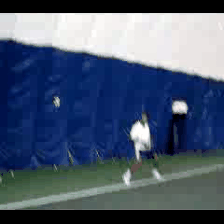

In [48]:
def prepare_single_video(frames):
    frames = frames[None, ...]
    frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
    frame_featutes = np.zeros(shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")
    for i, batch in enumerate(frames):
        video_length = batch.shape[1]
        length = min(MAX_SEQ_LENGTH, video_length)
        for j in range(length):
            frame_featutes[i, j, :] = feature_extractor.predict(batch[None, j, :])
        frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked
    return frame_featutes, frame_mask

def sequence_prediction(path):
    class_vocab = label_processor.get_vocabulary()

    frames = load_video(os.path.join("test", path))
    frame_features, frame_mask = prepare_single_video(frames)
    probabilities = models['cnn-lstm'].predict([frame_features, frame_mask])[0]

    for i in np.argsort(probabilities)[::-1]:
        print(f"  {class_vocab[i]}: {probabilities[i] * 100:5.2f}%")
    return frames

# This utility is for visualization.
# Referenced from:
# https://www.tensorflow.org/hub/tutorials/action_recognition_with_tf_hub
def to_gif(images):
    converted_images = images.astype(np.uint8)
    imageio.mimsave("animation.gif", converted_images, fps=10)
    return embed.embed_file("animation.gif")

test_video = np.random.choice(test_df["video_name"].values.tolist())
print(f"Test video path: {test_video}")
test_frames = sequence_prediction(test_video)
to_gif(test_frames[:MAX_SEQ_LENGTH])

In [49]:
_, accuracy = models['cnn-lstm'].evaluate([test_data[0], test_data[1]], test_labels)
print(f"Test accuracy: {round(accuracy * 100, 2)}%")

7/7 [==============================] - 2s 31ms/step - loss: 1.5262 - accuracy: 0.6562
Test accuracy: 65.62%


In [50]:
if not os.path.isfile(checkpoint_dir + 'cnn-lstm/dataset.npz'):
    np.savez_compressed(checkpoint_dir + 'cnn-lstm/dataset',
                        train_data_0=train_data[0],
                        train_data_1=train_data[1],
                        train_labels=train_labels,
                        test_data_0=test_data[0],
                        test_data_1=test_data[1],
                        test_labels=test_labels)

### Get Weights

In [51]:
models['cnn-lstm'].summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            [(None, 20, 2048)]   0                                            
__________________________________________________________________________________________________
input_10 (InputLayer)           [(None, 20)]         0                                            
__________________________________________________________________________________________________
LSTM_1 (LSTM)                   (None, 20, 64)       540928      input_9[0][0]                    
                                                                 input_10[0][0]                   
__________________________________________________________________________________________________
LSTM_2 (LSTM)                   (None, 32)           12416       LSTM_1[0][0]               

In [52]:
print(models['cnn-lstm'].get_layer('LSTM_1').get_weights()[0].shape)
print(models['cnn-lstm'].get_layer('LSTM_2').get_weights()[0].shape)

(2048, 256)
(64, 128)


# Scaled SVD Approximation

In [53]:
def get_approx_size(R, k, m, n):
    return R * (m + n + k)

In [54]:
def plot_accuracies(model_labels, original_accuracies, approx_accuracies):
    x = np.arange(len(model_labels))  # the label locations
    width = 0.35  # the width of the bars
    fig, ax = plt.subplots()
    rects1 = ax.bar(x - width/2, original_accuracies, width, label='Original')
    rects2 = ax.bar(x + width/2, approx_accuracies, width, label='Approximated')
    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Accuracy')
    ax.set_title('Original Accuracy vs. Approximated.')
    ax.set_xticks(x)
    ax.set_xticklabels(model_labels)
    ax.legend()
    fig.tight_layout()
    plt.show()

In [55]:
models['fashion'].summary()
mnist_dense = [w1, b1] = models['mnist'].get_layer('dense_1').get_weights()
fashion_mnist_dense = [w2, b2] = models['fashion'].get_layer('dense_1').get_weights()
print(w1.shape, w2.shape)

Model: "fashion_mnist"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 784)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)               100480    
_________________________________________________________________
dense_2 (Dense)              (None, 10)                1290      
Total params: 101,770
Trainable params: 101,770
Non-trainable params: 0
_________________________________________________________________
(784, 128) (784, 128)


In [58]:
R = 45
metric = 'mse'
threshold = 1e-5
scalers = [1., 1.]

def run_alg3_for_mnist(scaler, apply_scaling_at_alg2, log_to_tensorboard=False):
    if log_to_tensorboard:
        logname = 'mnist'
        logname += f'_R{R}_scaler0_{scaler[0]}_scaler1_{scaler[1]}_{metric}_Th{threshold}'
        logname += '_date' + datetime.now().strftime('%Y%m%d-%H%M%S')
        writer = tf.summary.create_file_writer(os.path.join('/gdrive/My Drive/Colab Notebooks/svd/tensorboard', logname))
        %reload_ext tensorboard
    else:
        writer = None

    [w1, b1] = models['mnist'].get_layer('dense_1').get_weights()
    [w2, b2] = models['fashion'].get_layer('dense_1').get_weights()
    plotdata = {}
    w_approx = algorithm3_inverse(*algorithm3([w1, w2], \
                                                    num_refinements=R, \
                                                    num_sub_matrix=1, \
                                                    decomposition='eigen', \
                                                    stop_threshold=threshold, \
                                                    metric=metric, \
                                                    scaler=scaler, \
                                                    report_writer=writer, \
                                                    apply_scaling_at_alg2=apply_scaling_at_alg2, \
                                                    plotdata=plotdata))
    # Obtain original accuracies.
    _, mnist_acc = models['mnist'].evaluate(x_test, y_test, verbose=0)
    _, fashion_mnist_acc = models['fashion'].evaluate(fashion_test_images, fashion_test_labels, verbose=0)
    print('')
    print('[ORIGINAL] MNIST - Test accuracy: {:.1f}%'.format(100. * mnist_acc))
    print('[ORIGINAL] Fashion MNIST - Test accuracy: {:.1f}%'.format(100. * fashion_mnist_acc))
    
    # Set approximated weights and evaluate.
    models['mnist'].get_layer('dense_1').set_weights([w_approx[0], b1])
    models['fashion'].get_layer('dense_1').set_weights([w_approx[1], b2])
    print('')

    _, mnist_acc_approx = models['mnist'].evaluate(x_test, y_test, verbose=0)
    _, fashion_mnist_acc_approx = models['fashion'].evaluate(fashion_test_images, fashion_test_labels, verbose=0)
    print('[APPROX] MNIST - Test accuracy: {:.1f}%'.format(100. * mnist_acc_approx))
    print('[APPROX] Fashion MNIST - Test accuracy: {:.1f}%'.format(100. * fashion_mnist_acc_approx))

    print('\nMNIST - Accuracy drop: {:.1f}%'.format(100. * (mnist_acc - mnist_acc_approx)))
    print('Fashion MNIST - Accuracy drop: {:.1f}%'.format(100. * (fashion_mnist_acc - fashion_mnist_acc_approx)))
    print('')

    # Restore original weights and plot.
    models['mnist'].get_layer('dense_1').set_weights([w1, b1])
    models['fashion'].get_layer('dense_1').set_weights([w2, b2])

    plot_accuracies(['mnist', 'fashion'], [mnist_acc, fashion_mnist_acc],
                    [mnist_acc_approx, fashion_mnist_acc_approx])
    return w_approx[0], w_approx[1], plotdata

## Baseline

In [ ]:
_, _, plotdata = run_alg3_for_mnist(None, apply_scaling_at_alg2=True)

0.02243629066508845
0.03342261809473339


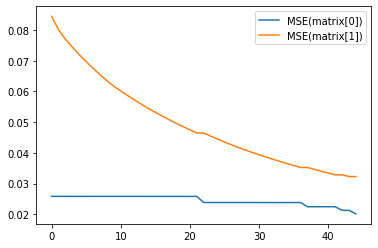

In [65]:
for matrix in plotdata:
    plt.plot(plotdata[matrix], label=matrix)
    print(plotdata[matrix][40])
plt.legend()

## Applying Scaling at Algorithm 3

In [ ]:
_, _, plotdata_alg3 = run_alg3_for_mnist([1., 1000.], apply_scaling_at_alg2=False)

0.025791287281387982
65961.02744391997


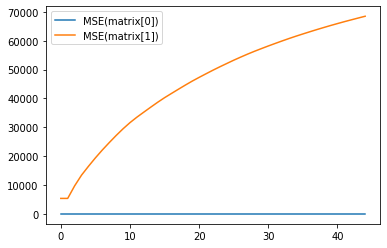

In [66]:
for matrix in plotdata_alg3:
    plt.plot(plotdata_alg3[matrix], label=matrix)
    print(plotdata_alg3[matrix][40])
plt.legend()

## Applying Scaling at Algorithm 2

In [56]:
_, _, plotdata_alg2 = run_alg3_for_mnist([1., 20.], apply_scaling_at_alg2=True)

NameError: ignored

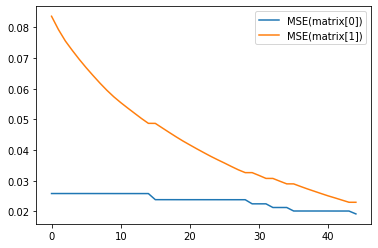

In [126]:
for matrix in plotdata:
    plt.plot(plotdata[matrix], label=matrix)
plt.legend()

## Additional Plotting

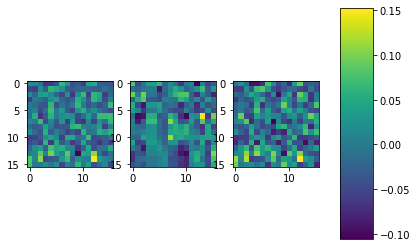

In [ ]:
plt.subplot(1, 3, 1)
plt.imshow(w1[:16,:16]) #, cmap=plt.cm.BuPu_r)
plt.subplot(1, 3, 2)
plt.imshow(w1_approx[:16,:16]) #, cmap=plt.cm.BuPu_r)
plt.subplot(1, 3, 3)
plt.imshow(w1[:16,:16] - w1_approx[:16,:16]) #, cmap=plt.cm.BuPu_r)

plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9)
cax = plt.axes([0.85, 0.1, 0.075, 0.8])
plt.colorbar(cax=cax)
plt.show()

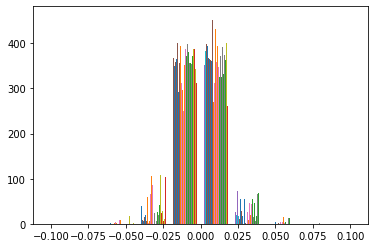

In [ ]:
n, bins, patches = plt.hist(w1_approx)
plt.show()

In [ ]:
print(f'Mean - orig/approx:         {w1.mean()} / {w1_approx.mean()}')
print(f'Standard dev - orig/approx: {w1.std()} / {w1_approx.std()}')

Mean - orig/approx:         -0.0028598906937986612 / 4.747437826569501e-05
Standard dev - orig/approx: 0.16066423058509827 / 0.012329364365807786


Current Compression Ratio (CR): 6.862144420131291


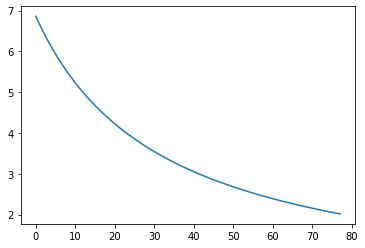

In [ ]:
cr = []

m, n = w1.shape
for r in range(R, (min(m, n))):
    tmp = 2 * m * n / get_approx_size(r, 2, m, n)
    if tmp < 2:
        break
    cr.append(tmp)

print('Current Compression Ratio (CR):', 2 * m * n / get_approx_size(R, 2, m, n))
plt.plot(cr)

# More than 2 Matrix Approximation

## Dividing weight matrix into 4

In [ ]:
models['fashion'].summary()
mnist_dense = [w, b] = models['mnist'].get_layer('dense_1').get_weights()
print(w.shape)
r, h = w.shape[0] // 2, w.shape[1] // 2
blocks = np.reshape(w, (4, r, h))
tmp = np.reshape(blocks, w.shape)
print(blocks.shape)
print(np.allclose(w, tmp))

Model: "fashion_mnist"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 784)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)               100480    
_________________________________________________________________
dense_2 (Dense)              (None, 10)                1290      
Total params: 101,770
Trainable params: 101,770
Non-trainable params: 0
_________________________________________________________________
(784, 128)
(4, 392, 64)
True


In [ ]:
R = 64
metric = 'mse'
threshold = 1e-5
scaler = [1.] * blocks.shape[0]

logname = 'mnist_4blocks'
logname += f'_R{R}_scaler0_{scaler[0]}_scaler1_{scaler[1]}_{metric}_Th{threshold}'
logname += '_date' + datetime.now().strftime('%Y%m%d-%H%M%S')
writer = tf.summary.create_file_writer(os.path.join('/gdrive/My Drive/Colab Notebooks/svd/tensorboard', logname))
%reload_ext tensorboard

%time w_approx = algorithm3_inverse(*algorithm3(blocks, \
                                                num_refinements=R, \
                                                num_sub_matrix=1, \
                                                decomposition='eigen', \
                                                stop_threshold=threshold, \
                                                metric=metric, \
                                                scaler=scaler, \
                                                report_writer=writer))

CPU times: user 36 s, sys: 19.5 s, total: 55.5 s
Wall time: 28.6 s


CR: 3.408695652173913
MNIST - Test accuracy: 0.9664999842643738

MNIST - Test accuracy: 0.9455999732017517

MNIST - Accuracy drop: 0.02090001106262207


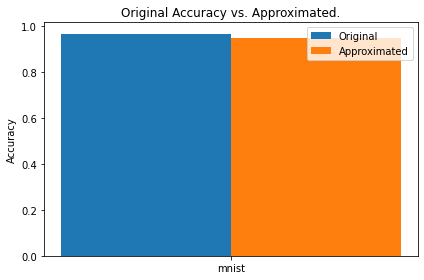

In [ ]:
k, m, n = blocks.shape
print(f'CR: {k * m * n / get_approx_size(R, k, m, n)}')

models['mnist'].get_layer('dense_1').set_weights([w, b])
_, mnist_acc = models['mnist'].evaluate(x_test, y_test, verbose=0)
print('MNIST - Test accuracy:', mnist_acc)

models['mnist'].get_layer('dense_1').set_weights([np.reshape(w_approx, w.shape), b])
print('')

_, mnist_acc_approx = models['mnist'].evaluate(x_test, y_test, verbose=0)
print('MNIST - Test accuracy:', mnist_acc_approx)

print('\nMNIST - Accuracy drop:', mnist_acc - mnist_acc_approx)

plot_accuracies(['mnist'], [mnist_acc], [mnist_acc_approx])

# Different Sizes Approximation

In [ ]:
w1 = np.random.randint(9, size=(4, 8))
w2 = np.random.randint(9, size=(5, 4))

max_shape = max_r, max_c = max(w1.shape[0], w2.shape[0]), max(w1.shape[1], w2.shape[1])
print(max_shape)

padded_w1 = np.zeros(max_shape)
padded_w2 = np.zeros(max_shape)
padded_w1[:w1.shape[0], :w1.shape[1]] = w1
padded_w2[:w2.shape[0], :w2.shape[1]] = w2

print(w1)
print(w2)
print(padded_w1)
print(padded_w2)

def pad_matrices(matrices):
    max_r = max([m.shape for m in matrices],key=lambda item:item[0])[0]
    max_c = max([m.shape for m in matrices],key=lambda item:item[1])[1]
    padded_matrices = []
    for i in range(len(matrices)):
        z = np.zeros((max_r, max_c))
        z[:matrices[i].shape[0], :matrices[i].shape[1]] = matrices[i]
        padded_matrices.append(z)
    return padded_matrices

pad_matrices([w1, w2])

(5, 8)
[[7 2 7 6 4 2 4 0]
 [1 2 6 0 7 4 2 8]
 [3 1 0 6 7 1 3 6]
 [1 8 5 8 0 1 1 6]]
[[4 8 6 1]
 [0 8 8 2]
 [0 7 3 7]
 [6 1 2 1]
 [5 0 8 3]]
[[7. 2. 7. 6. 4. 2. 4. 0.]
 [1. 2. 6. 0. 7. 4. 2. 8.]
 [3. 1. 0. 6. 7. 1. 3. 6.]
 [1. 8. 5. 8. 0. 1. 1. 6.]
 [0. 0. 0. 0. 0. 0. 0. 0.]]
[[4. 8. 6. 1. 0. 0. 0. 0.]
 [0. 8. 8. 2. 0. 0. 0. 0.]
 [0. 7. 3. 7. 0. 0. 0. 0.]
 [6. 1. 2. 1. 0. 0. 0. 0.]
 [5. 0. 8. 3. 0. 0. 0. 0.]]


[array([[7., 2., 7., 6., 4., 2., 4., 0.],
        [1., 2., 6., 0., 7., 4., 2., 8.],
        [3., 1., 0., 6., 7., 1., 3., 6.],
        [1., 8., 5., 8., 0., 1., 1., 6.],
        [0., 0., 0., 0., 0., 0., 0., 0.]]),
 array([[4., 8., 6., 1., 0., 0., 0., 0.],
        [0., 8., 8., 2., 0., 0., 0., 0.],
        [0., 7., 3., 7., 0., 0., 0., 0.],
        [6., 1., 2., 1., 0., 0., 0., 0.],
        [5., 0., 8., 3., 0., 0., 0., 0.]])]

In [ ]:
import operator

def get_cr_multi_size_matrix(R, matrices):
    max_m = max([m.shape for m in matrices],key=lambda item:item[0])[0]
    max_n = max([m.shape for m in matrices],key=lambda item:item[1])[1]
    approx_size = get_approx_size(R, len(matrices), max_m, max_n)
    orig_size = sum(map(lambda x: operator.mul(*x.shape), matrices))
    return orig_size / approx_size

w1 = np.random.randint(9, size=(4, 8))
w2 = np.random.randint(9, size=(5, 4))

orig_size = operator.mul(*w1.shape) + operator.mul(*w2.shape)
print(orig_size)
get_cr_multi_size_matrix(1, [w1, w2])

52


3.466666666666667

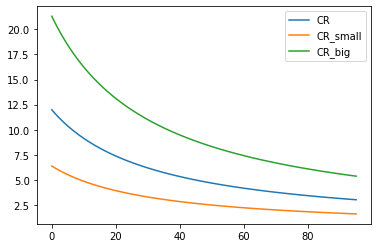

In [ ]:
cr = []
cr_small = []
cr_big = []

small_size = 128
medium_size = 512
large_size = 1024
w1 = np.random.randint(9, size=(medium_size, small_size))
w2 = np.random.randint(9, size=(large_size, medium_size))

for r in range(small_size // 4, small_size):
    m, n = w1.shape
    tmp = 2 * m * n / get_approx_size(r, 2, m, n)
    cr_small.append(tmp)
    m, n = w2.shape
    tmp = 2 * m * n / get_approx_size(r, 2, m, n)
    cr_big.append(tmp)
    tmp = get_cr_multi_size_matrix(r, [w1, w2])
    if tmp < 2:
        break
    cr.append(tmp)

plt.plot(cr, label='CR')
plt.plot(cr_small, label='CR_small')
plt.plot(cr_big, label='CR_big')
plt.legend()

## CNN-LSTM Model

In [ ]:
print(models['cnn-lstm'].get_layer('LSTM_1').get_weights()[0].shape)
print(models['cnn-lstm'].get_layer('LSTM_2').get_weights()[0].shape)
print(len(models['cnn-lstm'].get_layer('LSTM_1').get_weights()))
print(len(models['cnn-lstm'].get_layer('LSTM_2').get_weights()))

print(models['cnn-lstm'].get_layer('LSTM_2').get_weights()[1].shape)

[w1, r1, b1] = models['cnn-lstm'].get_layer('LSTM_1').get_weights()
[w2, r2, b2] = models['cnn-lstm'].get_layer('LSTM_2').get_weights()

[w1_pad, w2_pad] = pad_matrices([w1, w2])
print(w1_pad, w2_pad)
print(w1_pad.shape)
print(w2_pad.shape)

(2048, 256)
(64, 128)
3
3
(32, 128)
[[ 0.03283332  0.03514677 -0.00596567 ...  0.03670166 -0.00393717
  -0.0284326 ]
 [-0.01096857 -0.0448408  -0.02966657 ...  0.01016361 -0.05727449
   0.02986955]
 [-0.00811409 -0.0135733  -0.04766004 ...  0.04387834 -0.00304517
   0.02890401]
 ...
 [-0.00517103  0.01756404  0.01726159 ... -0.04113563 -0.02533144
   0.04300131]
 [-0.01353051  0.02406969  0.00367547 ...  0.01924247 -0.04716729
   0.02338111]
 [-0.03106386 -0.03033421  0.03282609 ...  0.0066899   0.00302576
  -0.03358177]] [[-0.05971472 -0.14265421  0.13733262 ...  0.          0.
   0.        ]
 [ 0.02199466  0.14343984  0.07385601 ...  0.          0.
   0.        ]
 [ 0.06103988  0.01135218  0.11987313 ...  0.          0.
   0.        ]
 ...
 [ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.          0.          0.         ...  0.          0.
   0.        ]]
(2048, 256)
(2048, 256)


In [ ]:
R = 25
metric = 'mse'
threshold = 1e-5
scaler = [1., 1.]

logname = 'cnn-lstm'
logname += f'_R{R}_scaler0_{scaler[0]}_scaler1_{scaler[1]}_{metric}_Th{threshold}'
logname += '_date' + datetime.now().strftime('%Y%m%d-%H%M%S')
writer = tf.summary.create_file_writer(os.path.join('/gdrive/My Drive/Colab Notebooks/svd/tensorboard', logname))
%reload_ext tensorboard

# %time u, s, v = algorithm3([w1_pad, w2_pad], \
#                       num_refinements=R, \
#                       num_sub_matrix=1, \
#                       decomposition='eigen', \
#                       stop_threshold=threshold, \
#                       metric=metric, \
#                       scaler=scaler, \
#                       report_writer=writer)

%time u, s, v = algorithm3_extra_refinements([w1_pad, w2_pad], u, s, v, \
                      num_refinements=R, \
                      num_sub_matrix=1, \
                      decomposition='eigen', \
                      stop_threshold=threshold, \
                      metric=metric, \
                      scaler=scaler, \
                      report_writer=writer)
w_approx = algorithm3_inverse(u, s, v)


w1_approx, w2_approx = w_approx[0], w_approx[1]

CPU times: user 3min 4s, sys: 26.1 s, total: 3min 30s
Wall time: 1min 49s


CNN-LSTM - Test accuracy: 0.65625

CNN-LSTM - Test accuracy: 0.34375 (approx)

Accuracy drop: 0.3125


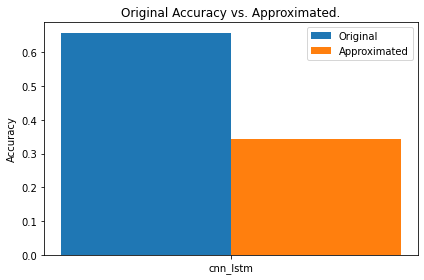

In [ ]:
models['cnn-lstm'].get_layer('LSTM_1').set_weights([w1, r1, b1])
models['cnn-lstm'].get_layer('LSTM_2').set_weights([w2, r2, b2])

_, cnn_lstm_acc = models['cnn-lstm'].evaluate([test_data[0], test_data[1]], test_labels, verbose=0)
print(f'CNN-LSTM - Test accuracy: {cnn_lstm_acc}')

models['cnn-lstm'].get_layer('LSTM_1').set_weights([w1_approx[:w1.shape[0], :w1.shape[1]], r1, b1])
models['cnn-lstm'].get_layer('LSTM_2').set_weights([w2_approx[:w2.shape[0], :w2.shape[1]], r2, b2])

_, cnn_lstm_approx_acc = models['cnn-lstm'].evaluate([test_data[0], test_data[1]], test_labels, verbose=0)
print(f'\nCNN-LSTM - Test accuracy: {cnn_lstm_approx_acc} (approx)')
print(f'\nAccuracy drop: {cnn_lstm_acc - cnn_lstm_approx_acc}')

plot_accuracies(['cnn_lstm'], [cnn_lstm_acc], [cnn_lstm_approx_acc])

# Minimization

# Playing with Images

(3, 300, 364)


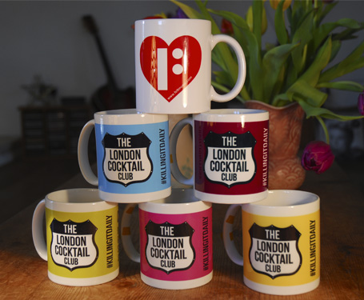

In [110]:
img = Image.open('/gdrive/My Drive/UNIVERSITY - PhD CHALMERS/mugs.jpg') #.convert('L')
img = img.resize([int(0.8 * s) for s in img.size])
img_array = np.array(img).transpose([2, 0, 1]).astype('float32')
num_inputs, input_size, output_size = img_array.shape
print(img_array.shape)
img

CPU times: user 12.3 s, sys: 6.01 s, total: 18.3 s
Wall time: 9.42 s


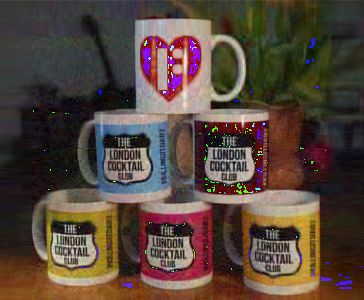

In [111]:
%time img_approx = algorithm3_inverse(*algorithm3(img_array, num_refinements=64, num_sub_matrix=1, decomposition='eigen')).transpose([1, 2, 0])
image = img_approx.copy()
image *= (255.0 / image.max()) # .clip(min=0, max=255.0)
Image.fromarray(image.astype('uint8'))

CPU times: user 20.2 s, sys: 12.9 s, total: 33.1 s
Wall time: 17.7 s


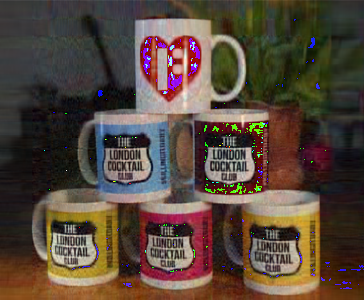

In [ ]:
%time img_approx = algorithm3_inverse(*algorithm3(img_array, num_refinements=64, num_sub_matrix=1, decomposition='svd')).transpose([1, 2, 0])
image = img_approx.copy()
image *= (255.0 / image.max()) # .clip(min=0, max=255.0)
Image.fromarray(image.astype('uint8'))

### Combine three different images

In [ ]:
cat = Image.open('/gdrive/My Drive/UNIVERSITY - PhD CHALMERS/cat.jpg').convert('LA').resize([512, 256])
mugs = Image.open('/gdrive/My Drive/UNIVERSITY - PhD CHALMERS/mugs.jpg').convert('LA').resize([512, 256])
flower = Image.open('/gdrive/My Drive/UNIVERSITY - PhD CHALMERS/sun_flower.png').convert('LA').resize([512, 256])

cat_img = cat = ImageOps.grayscale(cat)
mugs_img = mugs = ImageOps.grayscale(mugs)
flower_img = flower = ImageOps.grayscale(flower)

cat = np.array(cat).astype('float32')
mugs = np.array(mugs).astype('float32')
flower = np.array(flower).astype('float32')

img_array = np.array([cat, mugs, flower])
print(img_array.shape)

cat_img, mugs_img, flower_img

(3, 256, 512)


(<PIL.Image.Image image mode=L size=512x256 at 0x7F759081A8D0>,
 <PIL.Image.Image image mode=L size=512x256 at 0x7F759081A710>,
 <PIL.Image.Image image mode=L size=512x256 at 0x7F759081A450>)

In [ ]:
R = 8
metric = 'frobenius-norm'
threshold = 1e-5
logname = 'base'
logname += '_R{}_{}_Th{}'.format(R, metric, threshold)
logname += '_date' + datetime.now().strftime('%Y%m%d-%H%M%S')
writer = tf.summary.create_file_writer(os.path.join('/gdrive/My Drive/Colab Notebooks/svd/tensorboard', logname))
%reload_ext tensorboard

%time img_approx = algorithm3_inverse(*algorithm3(img_array, \
                                                  num_refinements=R, \
                                                  num_sub_matrix=1, \
                                                  decomposition='eigen', \
                                                  stop_threshold=threshold, \
                                                  metric=metric, \
                                                  report_writer=writer))
img_approx *= (255.0 / img_approx.max()) # .clip(min=0, max=255.0)

CPU times: user 37.2 s, sys: 19.3 s, total: 56.5 s
Wall time: 29.1 s


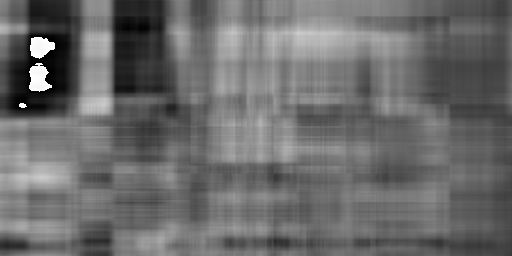

In [ ]:
cat_approx = Image.fromarray(img_approx[0].astype('uint8'))
cat_approx

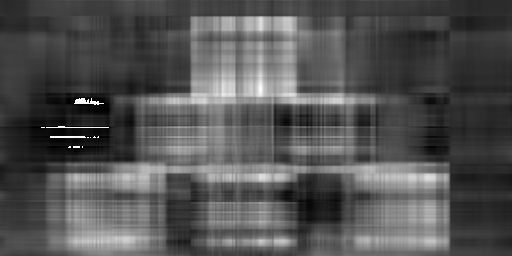

In [ ]:
mugs_approx = Image.fromarray(img_approx[1].astype('uint8'))
mugs_approx

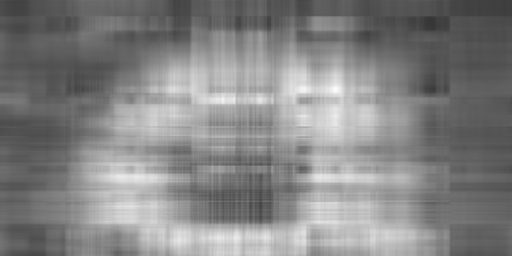

In [ ]:
flower_approx = Image.fromarray(img_approx[2].astype('uint8'))
flower_approx

In [ ]:
def frobenius(x, x_approx):
    return np.sqrt(np.absolute(np.linalg.norm(x - x_approx)))

def mse(x, x_approx):
    return ((x - x_approx)**2).mean()

print(mse(cat, cat_approx))
print(mse(mugs, mugs_approx))
print(mse(flower, flower_approx))

# 402.30466
# 335.3521
# 365.27515

1273.5289
1101.8867
995.1124


In [ ]:
from tensorflow.python.training import gradient_descent

x = tf.Variable(10.0, trainable=True)

@tf.function
def f_x():
    return 2 * x * x - 5 * x + 4

for _ in range(20):
    print([x.numpy(), f_x().numpy()])
    opt = gradient_descent.GradientDescentOptimizer(0.1).minimize(f_x)

[10.0, 154.0]
[6.5, 56.0]
[4.4, 20.720001]
[3.14, 8.019201]
[2.384, 3.4469128]
[1.9304, 1.8008881]
[1.65824, 1.2083197]
[1.494944, 0.9949951]
[1.3969663, 0.9181981]
[1.3381798, 0.89055157]
[1.302908, 0.88059855]
[1.2817447, 0.8770151]
[1.2690468, 0.8757255]
[1.2614281, 0.87526155]
[1.2568569, 0.87509394]
[1.2541142, 0.87503386]
[1.2524685, 0.87501216]
[1.251481, 0.8750043]
[1.2508886, 0.87500143]
[1.2505331, 0.8750005]


0.27518278
0.6178978


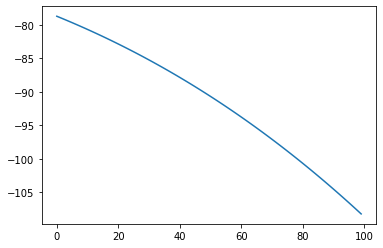

In [ ]:
m, n = w1.shape
p = 2
u = tf.Variable([[np.random.rand()] * n], trainable=True)
v = tf.Variable([[np.random.rand()] * m], trainable=True)
s = tf.Variable([np.random.rand()] * p, trainable=True)
w = np.array([w1, w2])

@tf.function
def f_x():
    # # A = tf.Variable([[tf.constant_initializer(0)] * m] * n, trainable=False)
    # for i in range(p):
    #     v_tmp = tf.transpose(v) * w[i].T
    #     # print('v_tmp.shape:', v_tmp.shape)
    #     A_tmp = v_tmp * u
    #     # print('A_tmp.shape:', A_tmp.shape)
    #     if i == 0:
    #         A = A_tmp * A_tmp
    #     else:
    #         A = A + (A_tmp * A_tmp)
    # for i in range(p):
    #     s = tf.transpose(v) * w[i].T * u
    #     w_approx = s * u * tf.transpose(v)
    #     print('s.shape:', s.shape)
    #     print('w_approx.shape:', w_approx.shape)
    #     if i == 0:
    #         mse = (w[i].T - w_approx) * (w[i].T - w_approx)
    #     else:
    #         mse = mse + (w[i].T - w_approx) * (w[i].T - w_approx)

    uv = u * tf.transpose(v)
    s_tmp = tf.expand_dims(tf.expand_dims(s, axis=1), axis=2)
    approx = tf.reduce_sum(w - s_tmp * tf.stack([uv] * p), axis=0)
    return -tf.norm(approx, ord='fro', axis=[-2,-1])

norms = []
for _ in range(100):
    # print([x.numpy(), f_x().numpy()])
    # print(f_x().numpy())
    norms.append(f_x().numpy())
    opt = gradient_descent.GradientDescentOptimizer(0.0001).minimize(f_x)

plt.plot(norms)
print(u.numpy().mean())
print(v.numpy().mean())

313/313 - 0s - loss: 0.3365 - accuracy: 0.8820
MNIST - Test accuracy: 0.9768999814987183
Fashion MNIST - Test accuracy: 0.8820000290870667

313/313 - 0s - loss: 181.9923 - accuracy: 0.1000
MNIST - Test accuracy: 0.10279999673366547
Fashion MNIST - Test accuracy: 0.10000000149011612

MNIST - Accuracy drop: 0.8740999847650528
Fashion MNIST - Accuracy drop: 0.7820000275969505


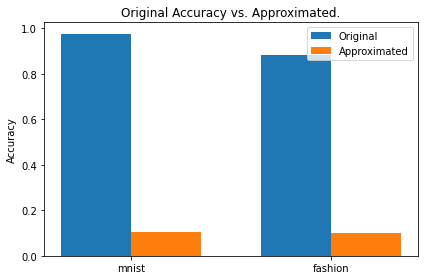

In [ ]:
models['mnist'].get_layer('dense_1').set_weights([w1, b1])
models['fashion'].get_layer('dense_1').set_weights([w2, b2])
_, mnist_acc = models['mnist'].evaluate(x_test, y_test, verbose=0)
_, fashion_mnist_acc = models['fashion'].evaluate(test_images,  test_labels, verbose=2)
print('MNIST - Test accuracy:', mnist_acc)
print('Fashion MNIST - Test accuracy:', fashion_mnist_acc)

A = (u * tf.transpose(v)).numpy()
w1_approx = s[0].numpy() * A
w2_approx = s[1].numpy() * A

models['mnist'].get_layer('dense_1').set_weights([w1_approx, b1])
models['fashion'].get_layer('dense_1').set_weights([w2_approx, b2])
print('')

_, mnist_acc_approx = models['mnist'].evaluate(x_test, y_test, verbose=0)
_, fashion_mnist_acc_approx = models['fashion'].evaluate(test_images,  test_labels, verbose=2)
print('MNIST - Test accuracy:', mnist_acc_approx)
print('Fashion MNIST - Test accuracy:', fashion_mnist_acc_approx)

print('\nMNIST - Accuracy drop:', mnist_acc - mnist_acc_approx)
print('Fashion MNIST - Accuracy drop:', fashion_mnist_acc - fashion_mnist_acc_approx)

plot_accuracies(list(models.keys()), [mnist_acc, fashion_mnist_acc],
                [mnist_acc_approx, fashion_mnist_acc_approx])

In [ ]:
# Use the GitHub version of TFCO
!pip install git+https://github.com/google-research/tensorflow_constrained_optimization
import tensorflow_constrained_optimization as tfco

  Cloning https://github.com/google-research/tensorflow_constrained_optimization to /tmp/pip-req-build-na3snryk
  Running command git clone -q https://github.com/google-research/tensorflow_constrained_optimization /tmp/pip-req-build-na3snryk
  Created wheel for tfco-nightly: filename=tfco_nightly-0.3.dev20210712-cp37-none-any.whl size=199274 sha256=0cf5a984216fd6779870302892eaf9d9d8eab8ee0dc4a74eda6e2fbf9af47c41
  Stored in directory: /tmp/pip-ephem-wheel-cache-8lu3v5rh/wheels/c9/b3/c3/78e0691949466af462380554286105216cd95a9ae7cf08ee78
Successfully built tfco-nightly


In [ ]:
m, n = w1.shape
p = 2
u = tf.Variable([[np.random.rand()] * n], trainable=True)
v = tf.Variable([[np.random.rand()] * m], trainable=True)
s = tf.Variable([np.random.rand()] * p, trainable=True)
w = np.array([w1, w2])

def loss_fn():
    uv = u * tf.transpose(v)
    s_tmp = tf.expand_dims(tf.expand_dims(s, axis=1), axis=2)
    approx = tf.reduce_sum(w - s_tmp * tf.stack([uv] * p), axis=0)
    for i in range(p):
        A_tmp = tf.transpose(v) * w[i].T * u
        if i == 0:
            A = A_tmp * A_tmp
        else:
            A = A + (A_tmp * A_tmp)
    return A - tf.norm(approx, ord='fro', axis=[-2, -1])

class SampleProblem(tfco.ConstrainedMinimizationProblem):
    def __init__(self, loss_fn, weights):
        self._loss_fn = loss_fn
        self._weights = weights
   
    @property
    def num_constraints(self):
        return 2
   
    def objective(self):
        return loss_fn()
   
    def constraints(self):
        u, s, v = self._weights
        u_norm = tf.linalg.norm(u) # tf.math.reduce_euclidean_norm(u)
        v_norm = tf.linalg.norm(v) # tf.math.reduce_euclidean_norm(v)
        u_norm_eq_one = 1 - u_norm
        v_norm_eq_one = 1 - v_norm
        constraints = tf.stack([u_norm_eq_one, v_norm_eq_one])
        # A = (u * tf.transpose(v)).numpy()
        # for i in range(p):
        #     rank_eq_one = 1. - tf.Variable(tf.cast(tf.rank(s[i] * A), tf.float32))
        #     constraints = tf.stack([constraints, rank_eq_one])
        return constraints

problem = SampleProblem(loss_fn, [u, s, v])
optimizer = tfco.LagrangianOptimizer(
    optimizer=tf.optimizers.Adagrad(learning_rate=0.1),
    num_constraints=problem.num_constraints)

var_list = [u, s, v] + list(problem.trainable_variables) + optimizer.trainable_variables()

for i in range(1000):
    optimizer.minimize(problem, var_list=var_list)
    if i % 100 == 0:
        print(f'step = {i}')
        print(f'loss = {loss_fn()}')
        # print(f'constraint = {(x + y).numpy()}')
        # print(f'u = {u.numpy()}, v = {v.numpy()}')

step = 0
loss = -662.9971313476562
step = 100
loss = -79729.0703125
step = 200
loss = -217770.546875
step = 300
loss = -395476.71875
step = 400
loss = -605416.375
step = 500
loss = -843243.875
step = 600
loss = -1106010.625
step = 700
loss = -1391545.0
step = 800
loss = -1698159.125
step = 900
loss = -2024494.0


313/313 - 0s - loss: 0.3365 - accuracy: 0.8820
MNIST - Test accuracy: 0.9768999814987183
Fashion MNIST - Test accuracy: 0.8820000290870667

313/313 - 0s - loss: 5028111.0000 - accuracy: 0.1000
MNIST - Test accuracy: 0.10279999673366547
Fashion MNIST - Test accuracy: 0.10000000149011612

MNIST - Accuracy drop: 0.8740999847650528
Fashion MNIST - Accuracy drop: 0.7820000275969505


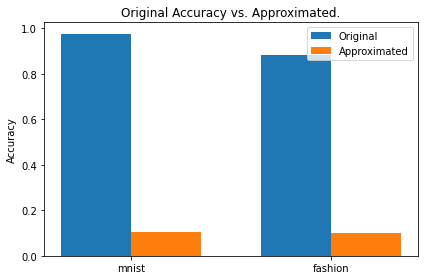